# *Potato Plant Disease Classification using Convolutional Neural Networks and Transfer Learning*


Ved Kotawadekar Roll No - 37 UID - 2309046

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In this particular project, we make use of the concepts of deep learning and convolutional neural networks in the agriculture domain. The main purpose of this project is to mainly help potato farmers distinguish between a plant that is infected by a disease or not by simply clicking a photo of the leaf and making use of our models created in order to determine if the plant is either healthy OR in the stage of early blight or late blight.

# Loading our Data and Data Pre-Processing

We start out by importing our necessary libraries and packages in order to perform all the tasks that are relevant to our assignment.

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.layers import Dense, Flatten
from tensorflow.keras.applications import ResNet50

So the dataset that we are using is called the Plant Village Dataset which is available on Kaggle. The link to the dataset is given below:

https://www.kaggle.com/datasets/arjuntejaswi/plant-village

As you open the dataset, you'll be able to see that it contains image data for different plants like bell pepper, tomato, potato, etc. All of these images are used for classification tasks in DL. But, in this assignment, we have not used the entirety of this dataset. We have only used the image data relevant to predicting the presence of a disease in the Potato Plant.

We load our dataset onto Google Colab by first uploading our image data onto Google Drive and then mounting our Google Drive to our current Colab Session which enables us to access our Google Drive files while we work on this session.

In [ ]:
#defining some important parameters for our assignment
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 50

Here, we create a dataset from the directory of the images that were uploaded on our Google Drive and we use **shuffle** in order to move around the images in a different order.

In [ ]:
data = tf.keras.preprocessing .image_dataset_from_directory(
    "/content/drive/MyDrive/PlantVillage",
    shuffle = True,
    image_size = (IMAGE_SIZE, IMAGE_SIZE),#resizing all img to fixed size
    batch_size = BATCH_SIZE #create batches of a fixed size
)

Found 2152 files belonging to 4 classes.


In [ ]:
class_names = data.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'models']

In [ ]:
len(data) #no of batches created

68

Just a display/visual representation of the data that we are working with

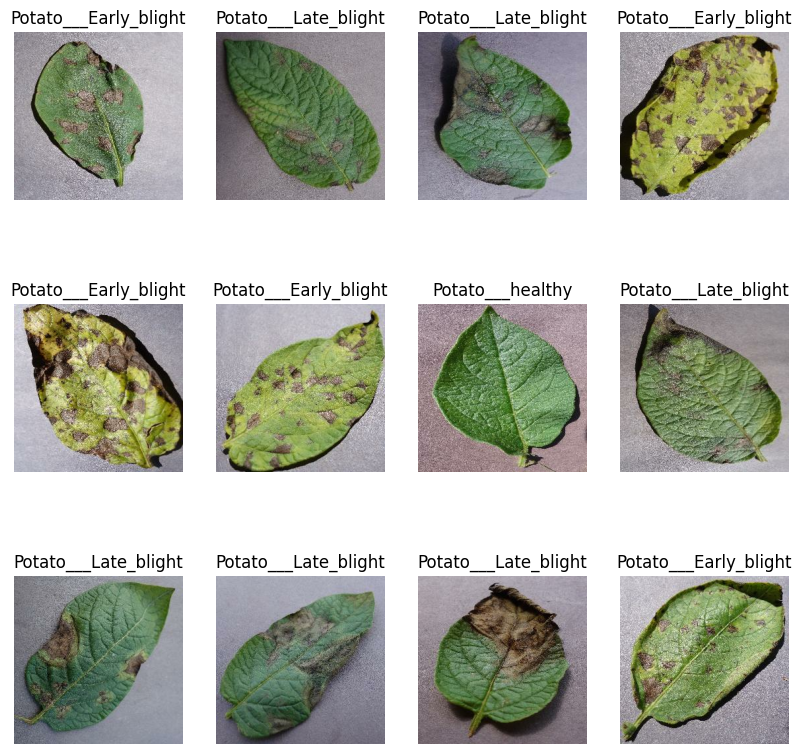

In [ ]:
plt.figure(figsize = (10,10))
for image_batch, label_batch in data.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

Now, we create a function called **get_data_partitions_tf**. What this does is that it splits our dataset into training, testing & validation datasets by 80%, 10% and 10% respectively. We also shuffle our data so that the model does not pick up on any inherent patterns.

In [ ]:
def get_data_partitions_tf(ds, train_split = 0.8, val_split = 0.1, test_split = 0.1, shuffle = True, shuffle_size = 10000):
    ds_size = len(ds)

    train_size = int(train_split*ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)

    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_data_partitions_tf(data)

In [ ]:
print("Length of Training Data = ",len(train_ds))
print("Length of Test Data = ",len(test_ds))
print("Length of Validation Data = ",len(val_ds))

Length of Training Data =  54
Length of Test Data =  8
Length of Validation Data =  6


In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)#cache used to speed up data loading for epochs
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)#prefetch used to improve performance
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size = tf.data.AUTOTUNE)#shuffled once again

##done to fecilitate important data processing

We now create a sequential model, which applies a series of transformations to input images.

We also rescale the pixel values of the images from the range [0, 255] to [0, 1] by dividing each pixel by 255. Normalizing the pixel values helps improve model performance during training by keeping values in a consistent range.


In [ ]:
resize_and_rescale = tf.keras.Sequential([ #resizing and rescaling our data
    tf.keras.layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    tf.keras.layers.Rescaling(1.0/255),
])

This block performs data augmentation such that it randomly flips and rotates images. These augmentations help the model learn from diverse variations of the same images, improving its robustness and generalization during training.

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2), #20% of 360 degs for each var
])

We end the stage of data pre-processing and transformation for our assignment. We now move on to the model building stage.

# Creating and Applying our Convolutional Neural Network Models

We start out with the creation of a basic convolutional neural network. We make use of a CNN model, where layers are added one after the other in a linear stack.

In [ ]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3 #color channels for RGB Image

model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32, (3,3), activation = 'relu', input_shape= input_shape), #relu to intro non-linearity(all cases)
    layers.MaxPooling2D((2,2)),#maxp = window_size, reduce spatial dims
    layers.Conv2D(64, kernel_size = (3,3), activation = 'relu'),#conv = kernel size
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, kernel_size =(3,3), activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),#2d fm --->1d fv
    layers.Dense(64, activation='relu'),#learn hi lvl features
    layers.Dense(n_classes,activation='softmax'),
])

model.build(input_shape = input_shape) #build mod with spec I.S.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_1 (Sequential)            │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (32, 254, 254, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (32, 127, 127, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (32, 125, 125, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (32, 62, 62, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (32, 60, 60, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (32, 30, 30, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (32, 28, 28, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (32, 14, 14, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (32, 12, 12, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (32, 6, 6, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (32, 4, 4, 64)              │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (32, 2, 2, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (32, 256)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (32, 64)                    │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (32, 3)                     │             195 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

Here, we configure the model for training by specifying the optimizer, loss function, and performance metrics.

In [ ]:
model.compile(optimizer = 'adam',  #y adam? = pop for DL tasks
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = False), #SCC for multi-classi probs
              metrics = ['accuracy']
             )

Here, we train the model using the training data. The result of this training is stored in the history variable, which contains information about the model's performance (loss, accuracy, etc.) during training and validation for each epoch.

In [ ]:
history = model.fit(train_ds,
                    epochs = EPOCHS,
                    batch_size = BATCH_SIZE,
                    verbose = 1, #show metrics for each iteration
                    validation_data = val_ds
                   )

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 740s 3s/step - accuracy: 0.4460 - loss: 0.9554 - val_accuracy: 0.4740 - val_loss: 0.9313
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6428 - loss: 0.8038 - val_accuracy: 0.8177 - val_loss: 0.5168
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - accuracy: 0.8303 - loss: 0.4121 - val_accuracy: 0.7760 - val_loss: 0.4494
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.8601 - loss: 0.3323 - val_accuracy: 0.9115 - val_loss: 0.2544
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.8776 - loss: 0.2949 - val_accuracy: 0.8750 - val_loss: 0.2915
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - accuracy: 0.9139 - loss: 0.2209 - val_accuracy: 0.8438 - val_loss: 0.3430
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - accuracy: 0.9329 - loss: 0.2122 - val_accuracy: 0.9062 - val_loss: 0.1940
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - accuracy: 0.9153 - loss: 0.2247 - val_accuracy: 0.9740 - v

In [ ]:
scores = model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 65s 78ms/step - accuracy: 0.9971 - loss: 0.0090


We now store our evaluation metrics in a few set variables.

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

Thw below code displays two used to depict the training and validation accuracy over the epochs and the other for the training and validation loss. The goal is to visualize how well the model is learning and generalizing over time

Text(0.5, 1.0, 'Training and Validation Loss')

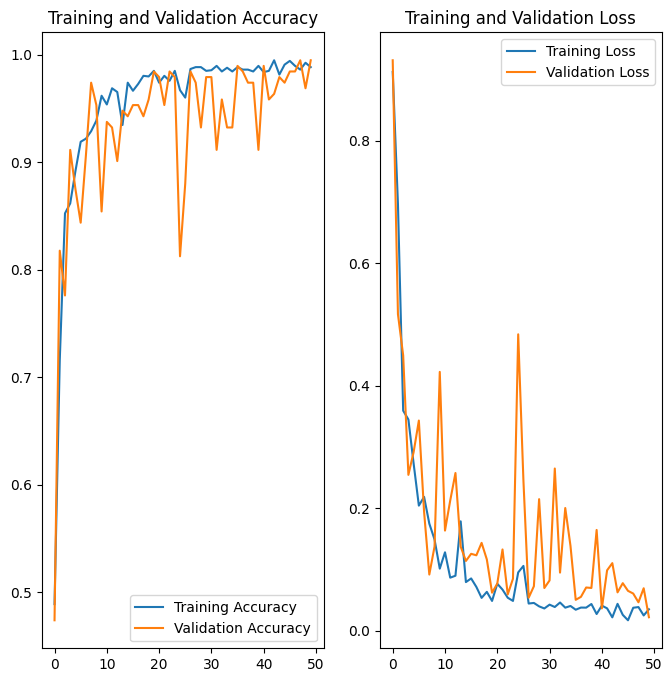

In [ ]:
#Train and Val Acc
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label = 'Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy')

#Loss
plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss, label = 'Training Loss')
plt.plot(range(EPOCHS), val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss')

In [ ]:
import numpy as np
'''for images_batch, labels_batch in test_ds.take(1):
  first_image = images_batch[0].numpy().astype('uint8')
  first_label = labels_batch[0].numpy()

  print("First image to predict")
  plt.imshow(first_image)
  print("Actual label:", class_names[first_label])

  batch_prediction = model.predict(images_batch)
  print("Predicted label:", class_names[np.argmax(batch_prediction[0])])'''

'for images_batch, labels_batch in test_ds.take(1):\n  first_image = images_batch[0].numpy().astype(\'uint8\')\n  first_label = labels_batch[0].numpy()\n\n  print("First image to predict")\n  plt.imshow(first_image)\n  print("Actual label:", class_names[first_label])\n\n  batch_prediction = model.predict(images_batch)\n  print("Predicted label:", class_names[np.argmax(batch_prediction[0])])'

This function takes an image and a trained model, preprocesses the image, and then uses the model to predict the class of the image. It returns the predicted class along with the confidence percentage for that prediction.

In [ ]:
def predict(model, img):
  img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array = tf.expand_dims(img_array, 0)

  predictions = model.predict(img_array)

  predicted_class = class_names[np.argmax(predictions[0])]
  confidence = round(100 * (np.max(predictions[0])), 2)
  return predicted_class, confidence

We now make use of this function to show how well our model predicts each class of the image.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


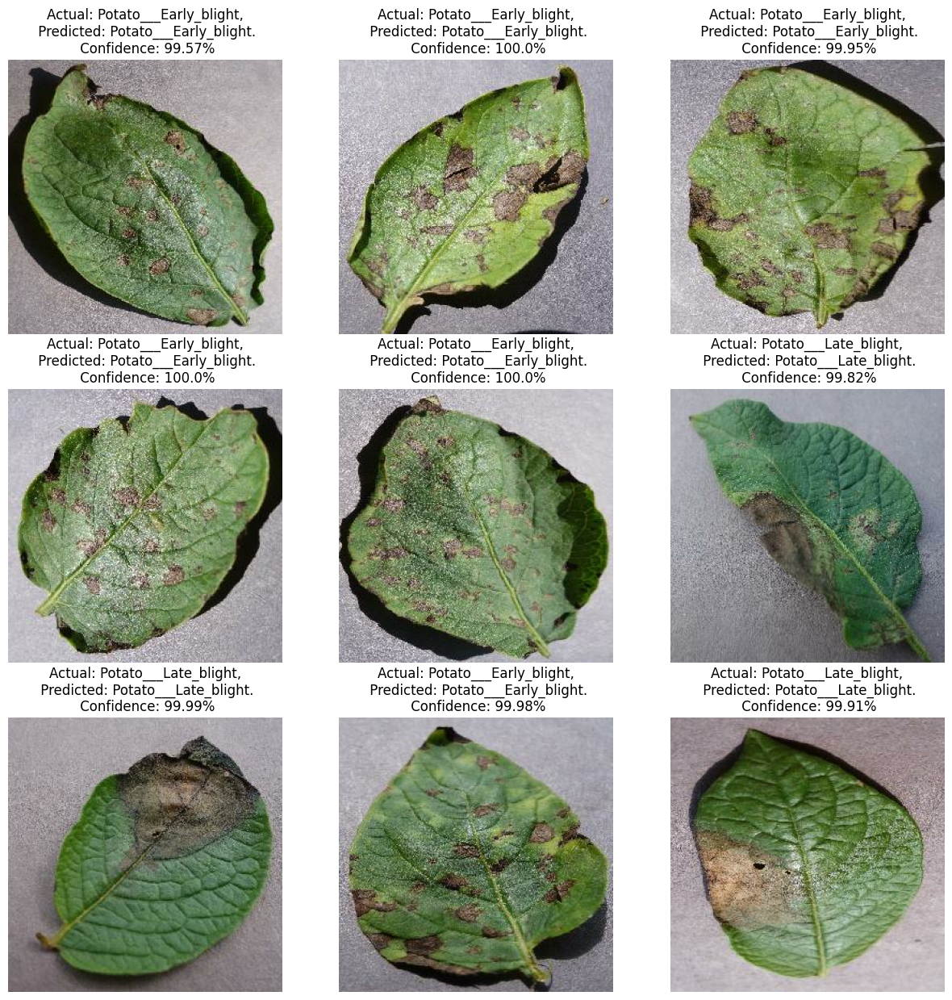

In [ ]:
plt.figure(figsize = (15,15))
for images, labels in test_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))

    predicted_class, confidence = predict(model, images[i].numpy())
    actual_class = class_names[labels[i]]

    plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

    plt.axis('off')

In [ ]:
# Save the model in Keras format (recommended)
#model.save('/content/drive/MyDrive/PlantVillage/models/plant_disease_model.keras')

So, now we have created our very own CNN model in order to make predictions. We now explore the different manners in which we can create CNN models or use any transfer-learning models on this very data.

# Constructing a Simple and a Deep CNN model

Basically,

Simple CNN = Lesser layers and filters

Deep CNN = Comparitively more layers and filters

Process is the same as our last model, just a little change in a few other details

In [ ]:
# Model 1: A simpler CNN model
def create_simple_model():
    model = models.Sequential([
        layers.Conv2D(16, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
        layers.MaxPooling2D(),
        layers.Conv2D(32, (3, 3), activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D(),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(len(class_names), activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Model 2: A deeper CNN model
def create_deep_model():
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
        layers.MaxPooling2D(),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.MaxPooling2D(),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(len(class_names), activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


In [ ]:
# Training the Simple Model
simple_model = create_simple_model()
history_simple = simple_model.fit(train_ds, epochs=EPOCHS, validation_data=val_ds)

# Training the Deep Model
deep_model = create_deep_model()
history_deep = deep_model.fit(train_ds, epochs=EPOCHS, validation_data=val_ds)


Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.5592 - loss: 113.9296 - val_accuracy: 0.8385 - val_loss: 0.5450
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.8558 - loss: 0.4413 - val_accuracy: 0.8490 - val_loss: 0.5737
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9110 - loss: 0.2780 - val_accuracy: 0.8750 - val_loss: 0.4095
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.9603 - loss: 0.1243 - val_accuracy: 0.8177 - val_loss: 0.4862
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.9565 - loss: 0.1218 - val_accuracy: 0.8802 - val_loss: 0.4939
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9525 - loss: 0.1756 - val_accuracy: 0.8490 - val_loss: 0.4255
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9739 - loss: 0.0864 - val_accuracy: 0.9271 - val_loss: 0.3110
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9942 - loss: 0.0183 - val_accuracy: 0.9010 

In [ ]:
scores = simple_model.evaluate(test_ds)
scores = deep_model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - accuracy: 0.9109 - loss: 1.1404
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - accuracy: 0.8253 - loss: 1.9590


For the Simple CNN

In [ ]:
#For the simple CNN model
acc1 = history_simple.history['accuracy']
val_acc1 = history_simple.history['val_accuracy']

loss1 = history_simple.history['loss']
val_loss1 = history_simple.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss for Simple CNN')

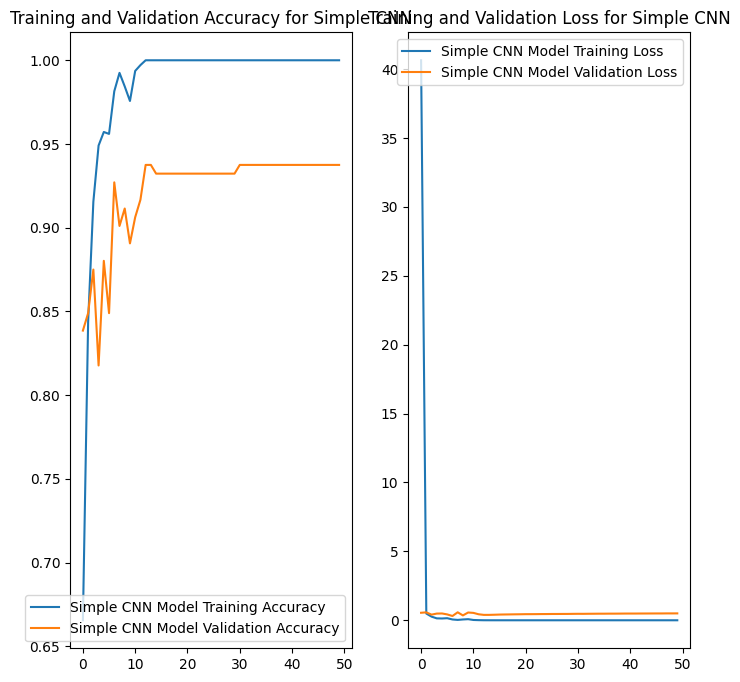

In [ ]:
#Train and Val Acc
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc1, label = 'Simple CNN Model Training Accuracy')
plt.plot(range(EPOCHS), val_acc1, label = 'Simple CNN Model Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy for Simple CNN')

#Loss
plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss1, label = 'Simple CNN Model Training Loss')
plt.plot(range(EPOCHS), val_loss1, label =  'Simple CNN Model Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss for Simple CNN')

For the Deep CNN

In [ ]:
acc2 = history_deep.history['accuracy']
val_acc2 = history_deep.history['val_accuracy']

loss2 = history_deep.history['loss']
val_loss2 = history_deep.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss Deep CNN')

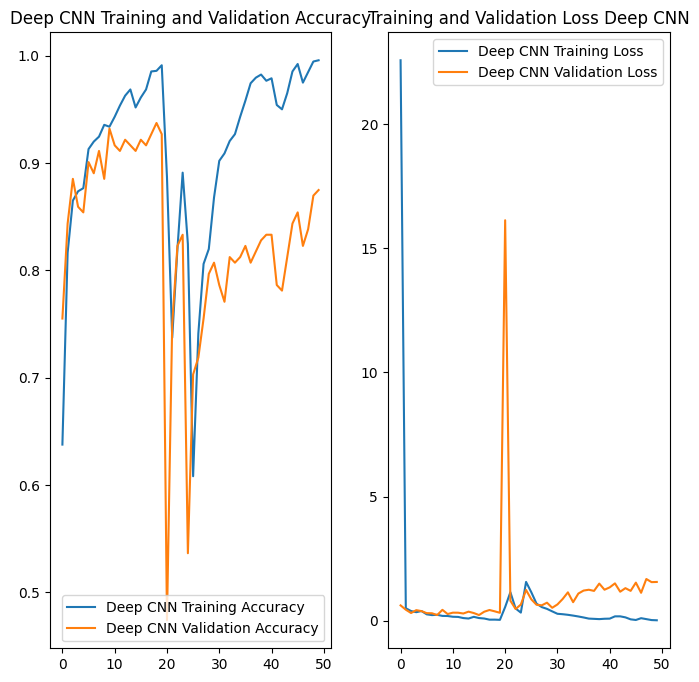

In [ ]:
#Train and Val Acc
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc2, label = 'Deep CNN Training Accuracy')
plt.plot(range(EPOCHS), val_acc2, label = 'Deep CNN Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Deep CNN Training and Validation Accuracy')

#Loss
plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss2, label = 'Deep CNN Training Loss')
plt.plot(range(EPOCHS), val_loss2, label = 'Deep CNN Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss Deep CNN')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


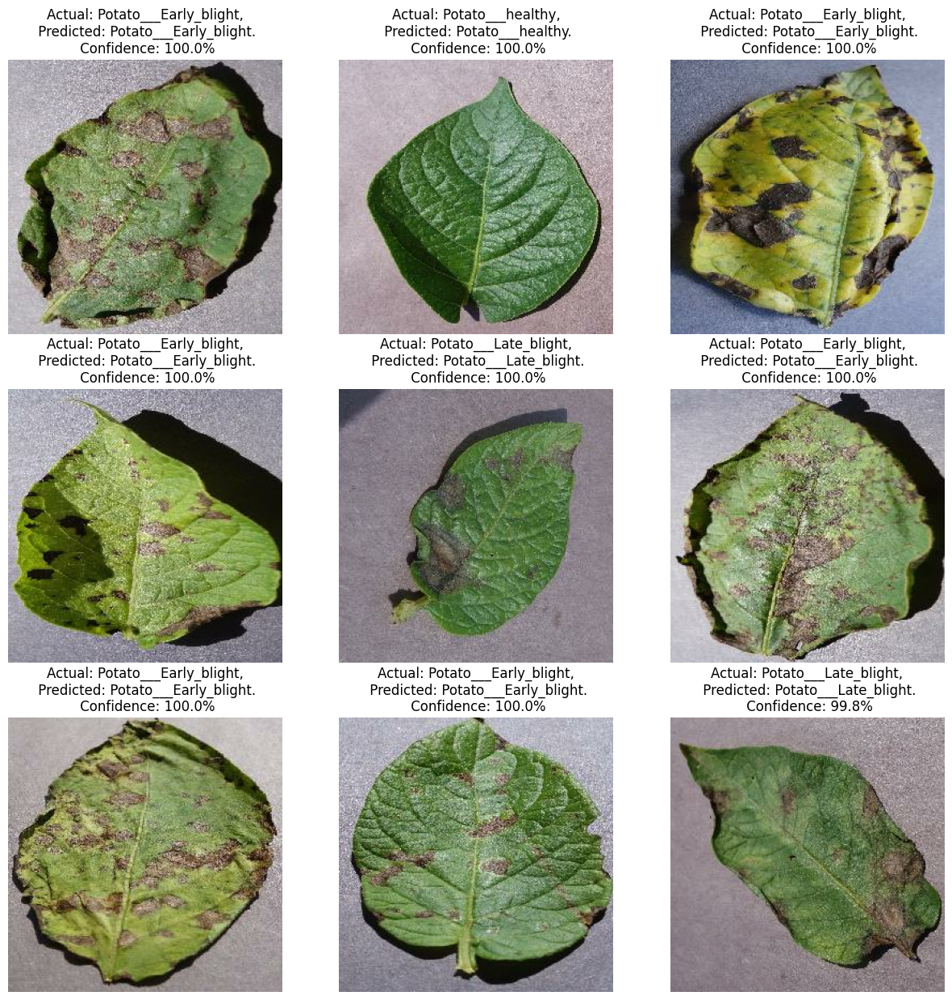

In [ ]:
# for simple cnn
plt.figure(figsize = (15,15))
for images, labels in test_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))

    predicted_class, confidence = predict(simple_model, images[i].numpy())
    actual_class = class_names[labels[i]]

    plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

    plt.axis('off')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


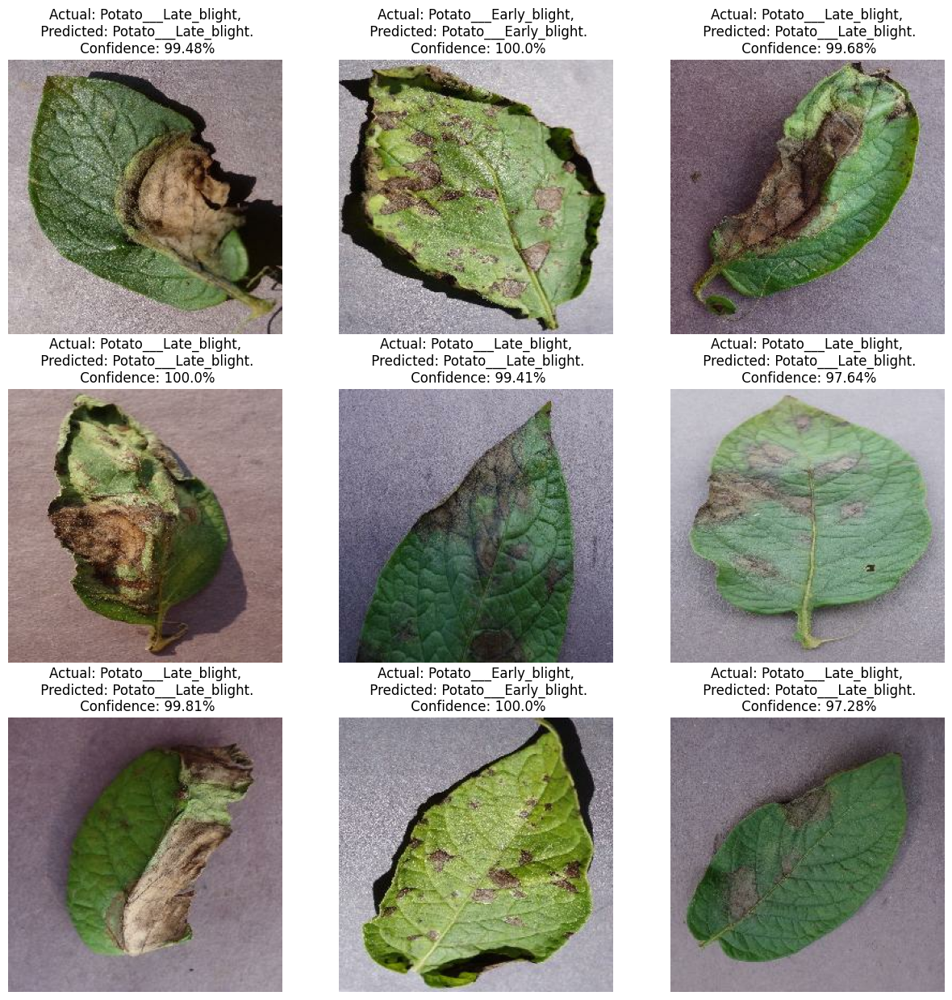

In [ ]:
#for deep cnn
plt.figure(figsize = (15,15))
for images, labels in test_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))

    predicted_class, confidence = predict(deep_model, images[i].numpy())
    actual_class = class_names[labels[i]]

    plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

    plt.axis('off')

# Transfer Learning using the VGG16 model

This code loads a pre-trained VGG16 model with weights from the ImageNet dataset, without the top classification layers, and sets the input image shape.

In [ ]:
vgg = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))#using pre-train w's on imagenet data

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
for layer in vgg.layers:
layer.trainable = False #freezes weight of all layers in VGG16

 Now, we work on a new model using the base of the VGG16 model by adding a flattening layer and a dense output layer with softmax activation on top of the pre-trained VGG16 model. The new model is set up to classify images into the specified number of classes based on the features extracted by VGG16.

In [ ]:
x = Flatten()(vgg.output)#vgg layers --> 1d vector
prediction = Dense(len(class_names), activation='softmax')(x)
model = Model(inputs=vgg.input, outputs=prediction)

In [ ]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 256, 256, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 128, 128, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 4)                   │         131,076 │
└──────────────────────────────────────┴─────────────────────────────┴──────────────

 Total params: 14,845,764 (56.63 MB)

 Trainable params: 131,076 (512.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
hist2 = model.fit(train_ds, epochs = EPOCHS, validation_data = val_ds)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 29s 198ms/step - accuracy: 0.7604 - loss: 8.5125 - val_accuracy: 0.9219 - val_loss: 2.0333
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 180ms/step - accuracy: 0.9785 - loss: 0.2883 - val_accuracy: 0.9688 - val_loss: 0.9288
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.9951 - loss: 0.0375 - val_accuracy: 0.9688 - val_loss: 0.9692
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9975 - loss: 0.0320 - val_accuracy: 0.9844 - val_loss: 0.7686
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 172ms/step - accuracy: 0.9976 - loss: 0.0133 - val_accuracy: 0.9688 - val_loss: 1.0085
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - accuracy: 0.9970 - loss: 0.0233 - val_accuracy: 0.9583 - val_loss: 1.2585
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 170ms/step - accuracy: 0.9942 - loss: 0.0313 - val_accuracy: 0.9583 - val_loss: 1.2699
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 173ms/step - accuracy: 0.9902 - loss: 0.1529 - val_accurac

In [ ]:
scores = model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.9766 - loss: 0.7561


In [ ]:
acc3 = hist2.history['accuracy']
val_acc3 = hist2.history['val_accuracy']

loss3 = hist2.history['loss']
val_loss3 = hist2.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss Deep CNN')

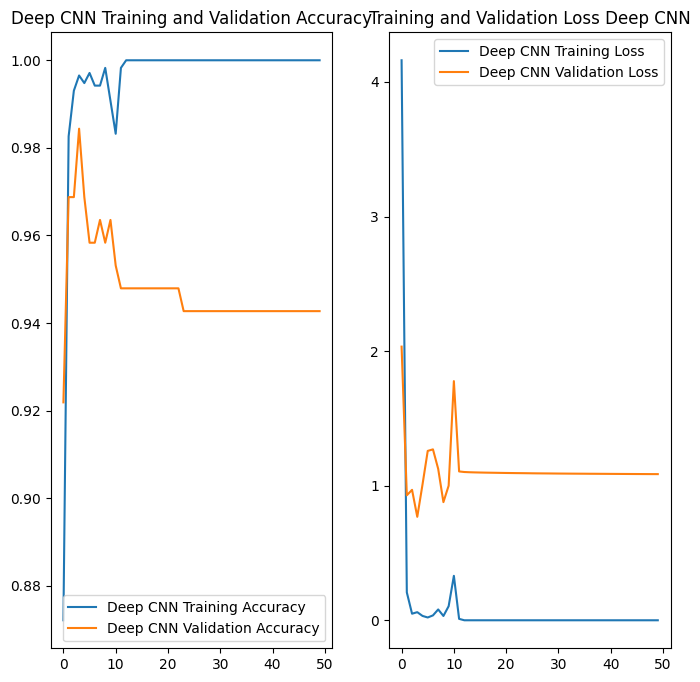

In [ ]:
#Train and Val Acc
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc3, label = 'Deep CNN Training Accuracy')
plt.plot(range(EPOCHS), val_acc3, label = 'Deep CNN Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Deep CNN Training and Validation Accuracy')

#Loss
plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss3, label = 'Deep CNN Training Loss')
plt.plot(range(EPOCHS), val_loss3, label = 'Deep CNN Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss Deep CNN')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


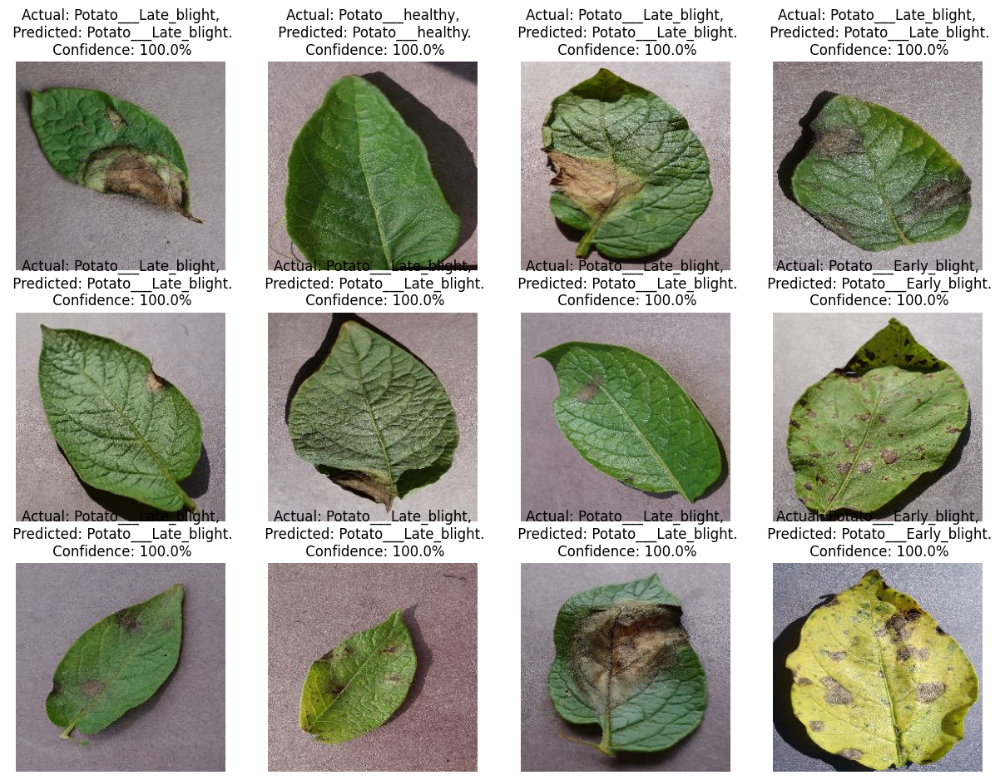

In [ ]:
plt.figure(figsize = (15,15))
for images, labels in test_ds.take(1):
  for i in range(12):
    ax = plt.subplot(4,4,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))

    predicted_class, confidence = predict(model, images[i].numpy())
    actual_class = class_names[labels[i]]

    plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

    plt.axis('off')

# Making use of Resnet50 Transfer Learning model as a base for our new model

We make use of ResNet50 in a similar manner to that of VGG16 model. Implementation steps are highly similar

In [ ]:
resnet = ResNet50(input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS),
                      include_top=False,  # Exclude the final classification layer
                      weights='imagenet')

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
for layer in resnet.layers:
        layer.trainable = False

Here, we define a model using the pre-trained ResNet architecture as the base, followed by global average pooling, a dense layer for feature learning, dropout for regularization, and a final output layer for multi-class classification.

In [ ]:
res50_model = models.Sequential([
        resnet,  # The pre-trained ResNet base
        layers.GlobalAveragePooling2D(),  # Reduces the feature maps to a single vector per image
        layers.Dense(256, activation='relu'),  # Add a dense layer with 256 units
        layers.Dropout(0.5),  # Dropout for regularization
        layers.Dense(len(class_names), activation='softmax')  # Output layer with class names as categories
    ])

In [ ]:
res50_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
hist3 = res50_model.fit(train_ds, epochs = EPOCHS, validation_data = val_ds)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 23s 183ms/step - accuracy: 0.7284 - loss: 0.9701 - val_accuracy: 0.9635 - val_loss: 0.1274
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.9683 - loss: 0.1121 - val_accuracy: 0.9844 - val_loss: 0.0692
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - accuracy: 0.9707 - loss: 0.0920 - val_accuracy: 0.9896 - val_loss: 0.0639
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - accuracy: 0.9824 - loss: 0.0621 - val_accuracy: 0.9844 - val_loss: 0.0469
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9810 - loss: 0.0572 - val_accuracy: 0.9896 - val_loss: 0.0450
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - accuracy: 0.9859 - loss: 0.0395 - val_accuracy: 0.9896 - val_loss: 0.0370
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - accuracy: 0.9869 - loss: 0.0367 - val_accuracy: 0.9896 - val_loss: 0.0416
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - accuracy: 0.9921 - loss: 0.0337 - val_accuracy

In [ ]:
scores = res50_model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - accuracy: 0.9920 - loss: 0.0366


In [ ]:
acc4 = hist3.history['accuracy']
val_acc4 = hist3.history['val_accuracy']

loss4 = hist3.history['loss']
val_loss4 = hist3.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss ResNet50')

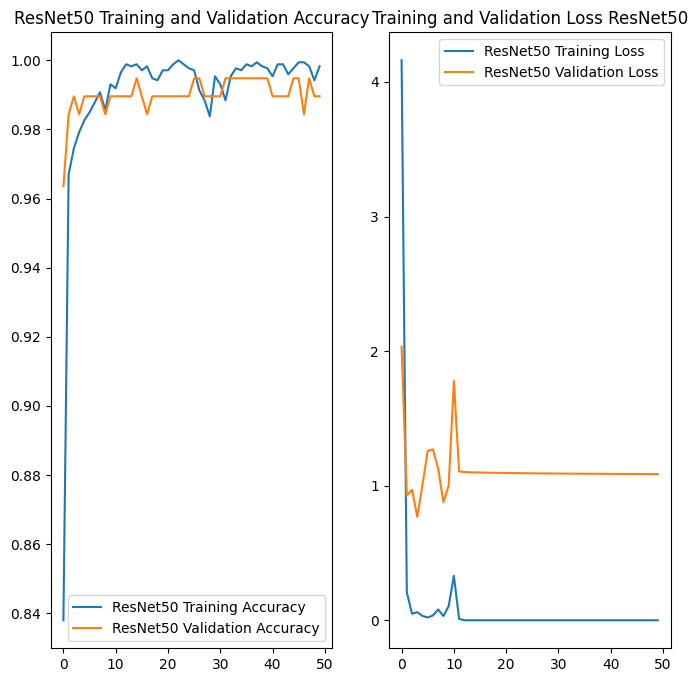

In [ ]:
#Train and Val Acc
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc4, label = 'ResNet50 Training Accuracy')
plt.plot(range(EPOCHS), val_acc4, label = 'ResNet50 Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('ResNet50 Training and Validation Accuracy')

#Loss
plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss3, label = 'ResNet50 Training Loss')
plt.plot(range(EPOCHS), val_loss3, label = 'ResNet50 Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss ResNet50')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


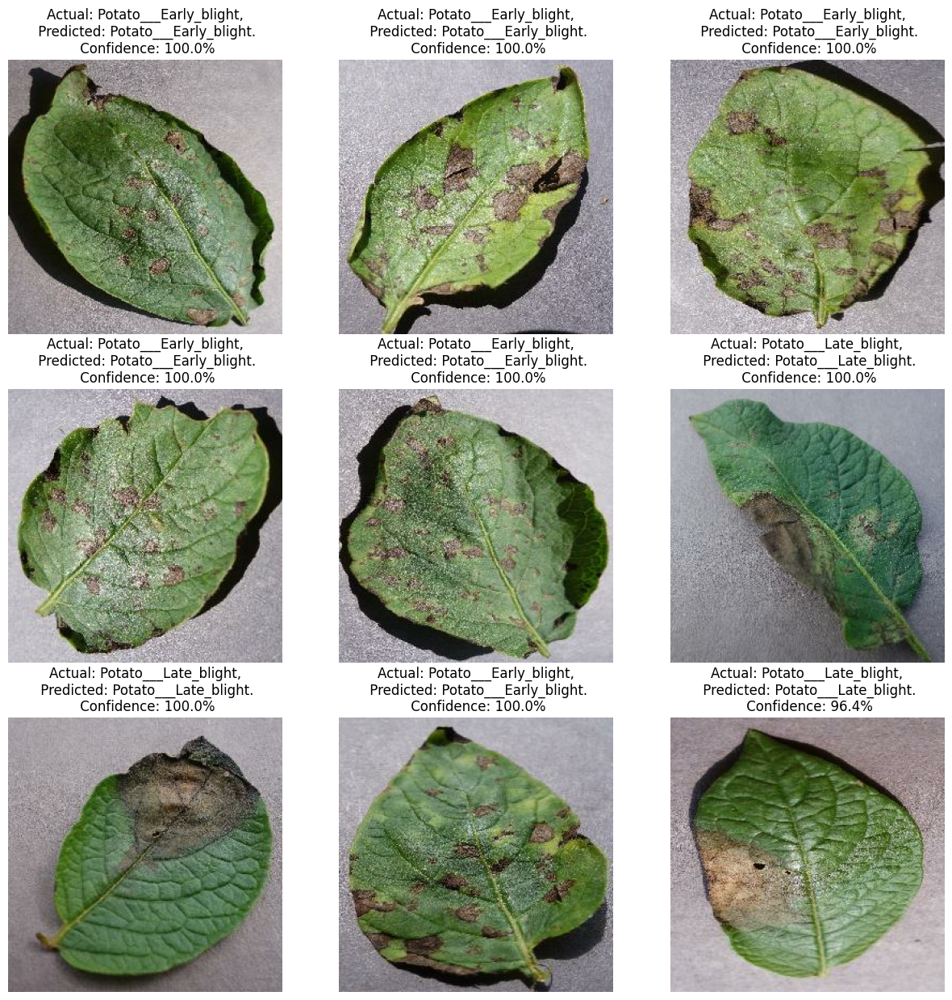

In [ ]:
plt.figure(figsize = (15,15))
# Changed test_ds.take(1) to test_ds.take(2) to take 2 batches instead of 1
for images, labels in test_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))

    predicted_class, confidence = predict(res50_model, images[i].numpy())
    actual_class = class_names[labels[i]]

    plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

    plt.axis('off')
